<a href="https://colab.research.google.com/github/Ohood-Alharbi/Diabetes-Health-Indicators-Classfication/blob/main/Diabetes_Health_Indicators_Classification_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [ ]:
#Python libraries
#Classic,data manipulation 
import numpy as np
import pandas as pd
# Plots
import plotly.graph_objects as go
import plotly.offline as po
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import random
import plotly.figure_factory as ff
from plotly import tools
from plotly.subplots import make_subplots
from plotly.offline import iplot
import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_rows",None)
from sklearn import preprocessing 
from sklearn.metrics import precision_score, recall_score, precision_recall_curve,f1_score, fbeta_score
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.tools as tls
import plotly.figure_factory as ff
py.init_notebook_mode(connected=True)
# Dataprep
# Modeling 
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import cross_val_score 
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from imblearn.combine import SMOTEENN #resampling
from sklearn import datasets, linear_model, metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Load Dataset 

In [13]:
df=pd.read_csv("/content/diabetes_012_health_indicators_BRFSS2015.csv") 
df.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


# Explore Dataset

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_012          253680 non-null  float64
 1   HighBP                253680 non-null  float64
 2   HighChol              253680 non-null  float64
 3   CholCheck             253680 non-null  float64
 4   BMI                   253680 non-null  float64
 5   Smoker                253680 non-null  float64
 6   Stroke                253680 non-null  float64
 7   HeartDiseaseorAttack  253680 non-null  float64
 8   PhysActivity          253680 non-null  float64
 9   Fruits                253680 non-null  float64
 10  Veggies               253680 non-null  float64
 11  HvyAlcoholConsump     253680 non-null  float64
 12  AnyHealthcare         253680 non-null  float64
 13  NoDocbcCost           253680 non-null  float64
 14  GenHlth               253680 non-null  float64
 15  

In [15]:
df.shape

(253680, 22)

In [16]:
df.sample(10)

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
197715,2.0,1.0,1.0,1.0,29.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,3.0,5.0,0.0,0.0,0.0,10.0,5.0,5.0
186511,0.0,0.0,1.0,1.0,39.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,1.0,6.0,4.0,6.0
116443,0.0,0.0,1.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,1.0,3.0,0.0,0.0,9.0,6.0,7.0
33473,0.0,0.0,0.0,1.0,19.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,5.0,7.0
16853,0.0,0.0,0.0,0.0,20.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,3.0,30.0,30.0,1.0,0.0,8.0,6.0,2.0
141295,0.0,0.0,1.0,1.0,26.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,1.0,11.0,5.0,2.0
69401,0.0,0.0,0.0,1.0,30.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,1.0,7.0,4.0,6.0
66202,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,15.0,0.0,0.0,1.0,5.0,6.0,8.0
82532,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,1.0,4.0,6.0,8.0
118210,0.0,1.0,0.0,1.0,21.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,2.0,10.0,0.0,0.0,0.0,8.0,6.0,8.0


In [17]:
df.columns

Index(['Diabetes_012', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

In [18]:
# to rename the some columns important of dataset
df.rename(columns={'Diabetes_012': 'Diabetes_Type'}, inplace=True)
df.head()

,Diabetes_Type,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


# Cleaning Dataset

In [19]:
df.isna().sum() # No missing value

Diabetes_Type           0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

In [20]:
df.BMI.unique()

array([40., 25., 28., 27., 24., 30., 34., 26., 33., 21., 23., 22., 38.,
       32., 37., 31., 29., 20., 35., 45., 39., 19., 47., 18., 36., 43.,
       55., 49., 42., 17., 16., 41., 44., 50., 59., 48., 52., 46., 54.,
       57., 53., 14., 15., 51., 58., 63., 61., 56., 74., 62., 64., 66.,
       73., 85., 60., 67., 65., 70., 82., 79., 92., 68., 72., 88., 96.,
       13., 81., 71., 75., 12., 77., 69., 76., 87., 89., 84., 95., 98.,
       91., 86., 83., 80., 90., 78.])

Would you say that in general your health is:scale 1-5:
> 1 = excellent 

> 2 = very good 

> 3 = good 

> 4 = fair 

> 5 = poor


In [21]:
df.GenHlth.unique()

array([5., 3., 2., 4., 1.])

Mental health scale:

> scale 1-30 days .

In [22]:
df.MentHlth.unique()

array([18.,  0., 30.,  3.,  5., 15., 10.,  6., 20.,  2., 25.,  1.,  4.,
        7.,  8., 21., 14., 26., 29., 16., 28., 11., 12., 24., 17., 13.,
       27., 19., 22.,  9., 23.])

Now thinking about your physical health, for how many days during the past 30 days 
was your physical health not good?

> scale 1-30 days 

In [23]:
df.PhysHlth.unique()

array([15.,  0., 30.,  2., 14., 28.,  7., 20.,  3., 10.,  1.,  5., 17.,
        4., 19.,  6., 12., 25., 27., 21., 22.,  8., 29., 24.,  9., 16.,
       18., 23., 13., 26., 11.])

13-level age categorys:(_AGEG5YR see codebook)
> 1 = 18-24 

> 9 = 60-64 

> 13 = 80 or older 


In [24]:
df.Age.unique()

array([ 9.,  7., 11., 10.,  8., 13.,  4.,  6.,  2., 12.,  5.,  1.,  3.])

Education level (EDUCA see codebook) scale 1-6:
> 1 = Never attended school or only kindergarten 

> 2 = Grades 1 through 8 (Elementary)

> 3 = Grades 9 throug 11 (Some high school)

> 4 = Grade 12 or GED (High school graduate)

> 5 = College 1 year to 3 years (Some college or technical school) 

> 6 = College 4 years or more (College graduate)

In [25]:
df.Education.unique()

array([4., 6., 3., 5., 2., 1.])

Income scale 1-8:
> 1 = less than $10,000 

> 5 = less than $35,000 

> 8 = $75,000 or more



In [26]:
df.Income.unique()

array([3., 1., 8., 6., 4., 7., 2., 5.])

In [27]:
df.Diabetes_Type.unique()

array([0., 2., 1.])

In [28]:
Diabetes=df['Diabetes_Type']
Diabetes.value_counts()

0.0    213703
2.0     35346
1.0      4631
Name: Diabetes_Type, dtype: int64

In [29]:
df['Diabetes_Type'].replace({2.0: 1.0},inplace = True)

# preprocessing

#### Display missing values through a library Dataprep.Eda

In [30]:
plot_missing(df) 

NameError: ignored

# Visualze the correlation 

In [31]:
df.corr()

,Diabetes_Type,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
Diabetes_Type,1.000000,0.270334,0.210290,0.067879,0.223851,0.062778,0.104800,0.176933,-0.121392,-0.042088,-0.059219,-0.056682,0.014079,0.038025,0.300785,0.074971,0.174948,0.222155,0.029606,0.185891,-0.131803,-0.172794
HighBP,0.270334,1.000000,0.298199,0.098508,0.213748,0.096991,0.129575,0.209361,-0.125267,-0.040555,-0.061266,-0.003972,0.038425,0.017358,0.300530,0.056456,0.161212,0.223618,0.052207,0.344452,-0.141358,-0.171235
HighChol,0.210290,0.298199,1.000000,0.085642,0.106722,0.091299,0.092620,0.180765,-0.078046,-0.040859,-0.039874,-0.011543,0.042230,0.013310,0.208426,0.062069,0.121751,0.144672,0.031205,0.272318,-0.070802,-0.085459
CholCheck,0.067879,0.098508,0.085642,1.000000,0.034495,-0.009929,0.024158,0.044206,0.004190,0.023849,0.006121,-0.023730,0.117626,-0.058255,0.046589,-0.008366,0.031775,0.040585,-0.022115,0.090321,0.001510,0.014259
BMI,0.223851,0.213748,0.106722,0.034495,1.000000,0.013804,0.020153,0.052904,-0.147294,-0.087518,-0.062275,-0.048736,-0.018471,0.058206,0.239185,0.085310,0.121141,0.197078,0.042950,-0.036618,-0.103932,-0.100069
Smoker,0.062778,0.096991,0.091299,-0.009929,0.013804,1.000000,0.061173,0.114441,-0.087401,-0.077666,-0.030678,0.101619,-0.023251,0.048946,0.163143,0.092196,0.116460,0.122463,0.093662,0.120641,-0.161955,-0.123937
Stroke,0.104800,0.129575,0.092620,0.024158,0.020153,0.061173,1.000000,0.203002,-0.069151,-0.013389,-0.041124,-0.016950,0.008776,0.034804,0.177942,0.070172,0.148944,0.176567,0.002978,0.126974,-0.076009,-0.128599
HeartDiseaseorAttack,0.176933,0.209361,0.180765,0.044206,0.052904,0.114441,0.203002,1.000000,-0.087299,-0.019790,-0.039167,-0.028991,0.018734,0.031000,0.258383,0.064621,0.181698,0.212709,0.086096,0.221618,-0.099600,-0.141011
PhysActivity,-0.121392,-0.125267,-0.078046,0.004190,-0.147294,-0.087401,-0.069151,-0.087299,1.000000,0.142756,0.153150,0.012392,0.035505,-0.061638,-0.266186,-0.125587,-0.219230,-0.253174,0.032482,-0.092511,0.199658,0.198539
Fruits,-0.042088,-0.040555,-0.040859,0.023849,-0.087518,-0.077666,-0.013389,-0.019790,0.142756,1.000000,0.254342,-0.035288,0.031544,-0.044243,-0.103854,-0.068217,-0.044633,-0.048352,-0.091175,0.064547,0.110187,0.079929


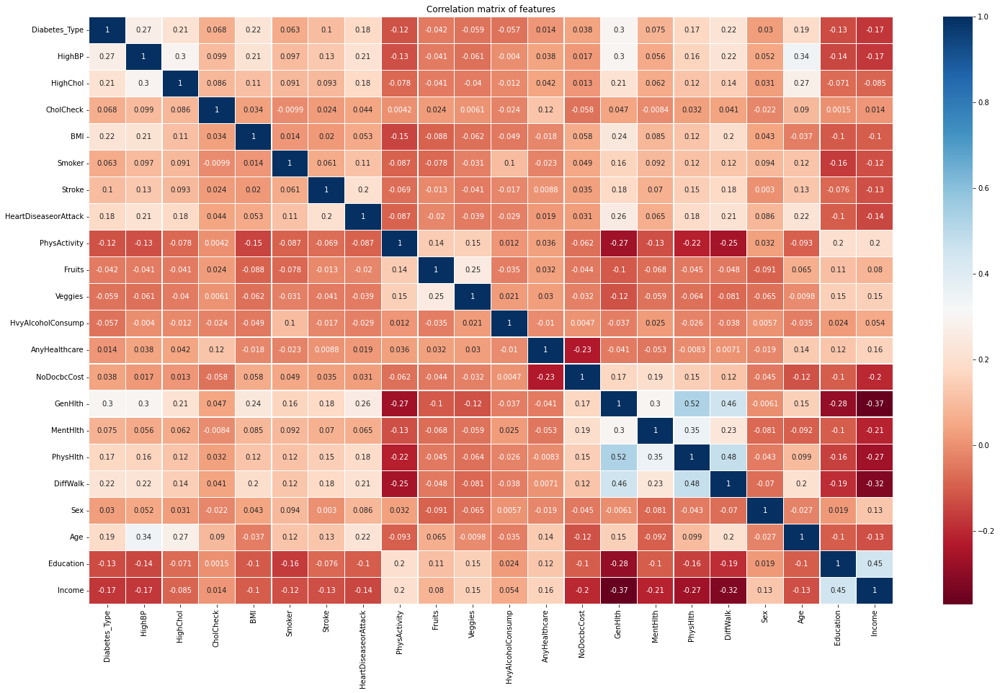

In [32]:
corr = df.corr()
fig, ax = plt.subplots(figsize=(25,15)) 
sns.heatmap(corr,annot=True, cmap = "RdBu", linewidth = 0.30)
plt.title("Correlation matrix of features")
plt.show()

In [33]:
df['Diabetes_Type'] = df['Diabetes_Type'].astype('int')

In [34]:
df['Diabetes']=df['Diabetes_Type']

In [35]:
df['Diabetes'] = df['Diabetes_Type'].map({0:'No Diabetes', 1:'Diabetes'})

In [36]:
Diabetes=df['Diabetes_Type']
Diabetes.value_counts()

0    213703
1     39977
Name: Diabetes_Type, dtype: int64

In [37]:
fig = px.pie(df['Diabetes_Type'].value_counts().reset_index(), values='Diabetes_Type', names=['No diabetes ', 'Diabetes'])
fig.update_traces(textposition='outside', textinfo='percent+label', )
fig.show()

In [38]:
df.head()

,Diabetes_Type,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes
0,0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0,No Diabetes
1,0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0,No Diabetes
2,0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0,No Diabetes
3,0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0,No Diabetes
4,0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0,No Diabetes


In [39]:
px.histogram(df, x=df['BMI'], title="The relationship between BMI and Diabetes", color="Diabetes")

In [40]:
px.histogram(df, x=df['HeartDiseaseorAttack'], title="Heart Diseaseor Attack vs. Diabetes", color="Diabetes")

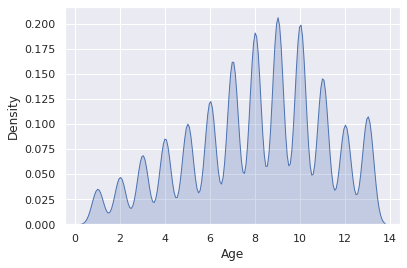

In [41]:
sns.set(style="darkgrid")
sns.kdeplot(data=df['Age'], shade=True)

In [42]:
diabetes_bp = df.groupby(['Diabetes_Type', 'HighBP']).size().reset_index(name = 'Count')
print(diabetes_bp)

   Diabetes_Type  HighBP   Count
0              0     0.0  134391
1              0     1.0   79312
2              1     0.0   10460
3              1     1.0   29517


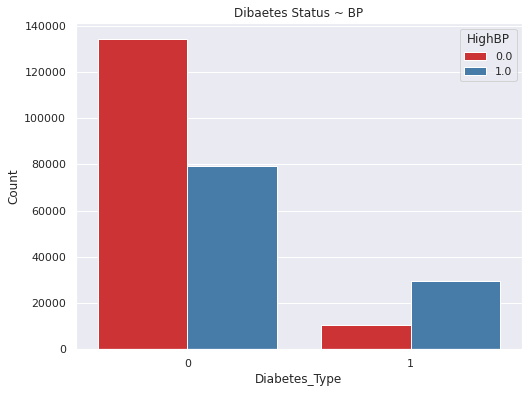

In [43]:
plt.figure(figsize = (8,6))
sns.barplot(x = 'Diabetes_Type', y = 'Count', hue = 'HighBP', data = diabetes_bp, palette = 'Set1')
plt.title("Dibaetes Status ~ BP")
plt.show()

In [44]:
df.columns


Index(['Diabetes_Type', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education', 'Income',
       'Diabetes'],
      dtype='object')

In [45]:
df['GH']=df['GenHlth']

In [46]:
df['GH'] = df['GH'].map({1:5, 2:4 ,3:3 ,4:2 , 5:1})

In [47]:
df.head()

,Diabetes_Type,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes,GH
0,0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0,No Diabetes,1
1,0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0,No Diabetes,3
2,0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0,No Diabetes,1
3,0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0,No Diabetes,4
4,0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0,No Diabetes,4


In [48]:
df.isna().sum()

Diabetes_Type           0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
Diabetes                0
GH                      0
dtype: int64

# Build models

## Experiment 1: Split data to training,validation and test set

In [49]:
smaller_df=df.loc[:,['Diabetes_Type', 'HighBP', 'HighChol', 'BMI', 'HeartDiseaseorAttack','PhysActivity', 'GenHlth','MentHlth','DiffWalk', 'Age']]
smaller_df1=df.loc[:,['Diabetes_Type', 'HighBP', 'HighChol', 'BMI', 'HeartDiseaseorAttack','PhysActivity', 'GH','MentHlth','DiffWalk', 'Age']]                  
                    
                    


In [50]:
df_train, df_test = train_test_split(smaller_df, test_size=0.20, random_state=0)
df_train, df_val = train_test_split(df_train, test_size=0.20, random_state=0)


df_train1, df_test1 = train_test_split(smaller_df1, test_size=0.20, random_state=0)
df_train1, df_val1 = train_test_split(df_train1, test_size=0.20, random_state=0)

## Scalling to give us fair distrubtion btw features

In [51]:
# The figure above display the correlation between the features and the target, for this i choose only these features
x_train1,y_train = df_train.drop(['Diabetes_Type'],axis=1),df_train['Diabetes_Type']
x_val1,y_val = df_val.drop(['Diabetes_Type'],axis=1),df_val['Diabetes_Type']
x_test1,y_test= df_test.drop(['Diabetes_Type'],axis=1),df_test['Diabetes_Type']

In [52]:


# The figure above display the correlation between the features and the target, for this i choose only these features
x_train2,y_train2 = df_train1.drop(['Diabetes_Type'],axis=1),df_train1['Diabetes_Type']
x_val2,y_val2 = df_val1.drop(['Diabetes_Type'],axis=1),df_val1['Diabetes_Type']
x_test2,y_test2 = df_test1.drop(['Diabetes_Type'],axis=1),df_test1['Diabetes_Type']

In [53]:
print(x_train1.shape)
print(x_val1.shape)
print(x_test1.shape)

(162355, 9)
(40589, 9)
(50736, 9)


In [54]:
#For smaller df1
scaler = MinMaxScaler()
scaler.fit(x_train1)

x_train = scaler.transform(x_train1)
x_test= scaler.transform(x_test1)
x_val=scaler.transform(x_val1)

In [55]:
#For smaller df2
scaler = MinMaxScaler()
scaler.fit(x_train2)

x_train2 = scaler.transform(x_train2)
x_test2= scaler.transform(x_test2)
x_val2=scaler.transform(x_val2)

In [56]:
# Using KNN (smaller df1) train on training set, and Test on testing set 
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train, y_train)
print("The score for kNN is")
print("Training set: {:6.2f}%".format(100*knn.score(x_train, y_train)))
print("Validation set: {:6.2f}%".format(100*knn.score(x_val, y_val)))
print("Test set: {:6.2f}%".format(100*knn.score(x_test, y_test)))

The score for kNN is
Training set:  86.47%
Validation set:  82.76%
Test set:  82.90%


In [ ]:
# using KNN (smaller df2) train on training set, and Test on testing set
knn1 = KNeighborsClassifier(n_neighbors=5)
knn1.fit(x_train2, y_train2)
print("The score for kNN is")
print("Training set: {:6.2f}%".format(100*knn.score(x_train2, y_train2)))
print("Validation set: {:6.2f}%".format(100*knn.score(x_val2, y_val2)))
print("Test set: {:6.2f}%".format(100*knn.score(x_test2, y_test2)))

The score for kNN is
Training set:  80.74%
Validation set:  79.57%
Test set:  79.33%


In [62]:
#test the baseline model for smaller df
#prediction
val_pred=knn.predict(x_val)
#Accuracy
confusion_hard = confusion_matrix( y_val, val_pred)
accuracy = accuracy_score(y_val , val_pred)
precision = precision_score(y_val , val_pred)
recall = recall_score(y_val , val_pred)
f1 = f1_score(y_val,val_pred) 
print('\nKNN Accuracy for validation set=: {0:.4f}, \nprecision: {1:.4f}, \nrecall: {2:.4f},\
\nF1: {3:.4f}'.format(accuracy, precision, recall, f1))


KNN Accuracy for validation set=: 0.8276, 
precision: 0.4135, 
recall: 0.2398,
F1: 0.3036


In [ ]:
# Print confusion matrix for kNN
knn_confusion = confusion_matrix(y_val, val_pred)
plt.figure(dpi=140)
sns.heatmap(knn_confusion, cmap=plt.cm.Blues, annot=True, square=True, 
            xticklabels=df_train['Diabetes_Type'], 
            yticklabels=df_train['Diabetes_Type'])

plt.xlabel('Predicted species')
plt.ylabel('Actual species')
plt.title('kNN confusion matrix');

### Experiment 2: Knn by using cross vaidation

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5)
scores = cross_val_score(knn, x_train, y_train, cv=10, scoring='accuracy')
print(scores)

In [ ]:
# use average accuracy as an estimate of out-of-sample accuracy
print(scores.mean())

In [ ]:
# search for an optimal value of K for KNN
k_range = list(range(1, 31))
k_scores = []
for k in k_range:
  knn = KNeighborsClassifier(n_neighbors=k)
  scores = cross_val_score(knn, x_train, y_train, cv=10, scoring='accuracy')
  k_scores.append(scores.mean())
  print(k_scores)

Text(0, 0.5, 'Cross-Validated Accuracy')

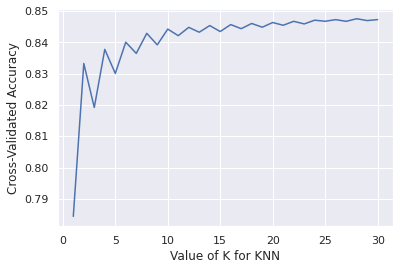

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

# plot the value of K for KNN (x-axis) versus the cross-validated accuracy (y-axis)
plt.plot(k_range, k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Accuracy')

## More efficient parameter tuning using `GridSearchCV`

In [ ]:
# define the parameter values that should be searched
k_range = list(range(1, 100))
param_grid = dict(n_neighbors=k_range)
grid = GridSearchCV(knn, param_grid, cv=10, scoring='accuracy')
# fit the grid with data
grid.fit(x_train, y_train);

NameError: ignored

In [ ]:
# examine the best model
print("Best params: ", grid.best_params_)
print("Best estimator: ", grid.best_estimator_)
print("Best score: ", grid.best_score_

## Searching multiple parameters simultaneously

In [ ]:
k_range = list(range(1, 31))
weight_options = ['uniform', 'distance']

In [ ]:
param_grid = dict(n_neighbors=k_range, weights=weight_options)
# instantiate and fit the grid
grid = GridSearchCV(knn, param_grid, cv=10, scoring='accuracy')
grid.fit(x_train, y_train)

In [ ]:
# examine the best model -- still 13 neighbors and uniform weights
print("Best params: ", grid.best_params_)
print("Best estimator: ", grid.best_estimator_)
print("Best score: ", grid.best_score_)

## Using the best parameters to make predictions

In [ ]:
# train your model using all data and the best known parameters
knn = KNeighborsClassifier(n_neighbors=13, weights='uniform')
knn.fit(X, y)

# make a prediction on out-of-sample data
knn.predict([[3, 5, 4, 2]])

In [ ]:
# shortcut: GridSearchCV automatically refits the best model using all of the data
grid.predict([[3, 5, 4, 2]])

Expreiment 3: Logistic Model

In [ ]:
lr=LogisticRegression()
prams ={"penalty": [ 'l1', 'l2'],
       "C": [0.5 , 0.7,0.8 , 1 , 2.0 , 3.0]}

lr_cv= GridSearchCV(lr , param_grid=prams, n_jobs=-1 ,cv=10)
lr_cv.fit(X_train , y_train )

print("Best params: ", lr_cv.best_params_)
print("Best estimator: " ,lr_cv.best_estimator_)
print("Best score: ", lr_cv.best_score_)

NameError: ignored

In [ ]:
lr_final

In [ ]:
lr_final.score(X_train , y_train)

NameError: ignored

In [ ]:
lr_final.score(X_test , y_test)

In [ ]:
lr=LogisticRegression(C= 1.0, penalty= "l2", max_iter=600)
lr.fit(X_train,y_train)
#lr.score(X_train,y_train)
print(lr.score(X_train, y_train))
print(lr.score(X_test,y_test)) 

# Model Optimization (Model Tunning)


In [ ]:
model_names = ["rf_final", "kn_final", "lr_final"]

In [ ]:
model_vars = [eval(n) for n in model_names]
model_list = list(zip(model_names, model_vars))

NameError: ignored

In [ ]:
model_list

In [ ]:
for model_name in model_names:
    curr_model = eval(model_name)
    print(f'{model_name} score: {curr_model.score(X_test, y_test)}')

rf_final score: 0.8268156424581006
kn_final score: 0.7262569832402235
lr_final score: 0.8100558659217877


# Max voting

In [ ]:
# create voting classifier
voting_classifer = VotingClassifier(estimators=model_list,
                                    voting='hard', #<-- sklearn calls this hard voting
                                    n_jobs=-1)
voting_classifer.fit(X_train, y_train)

VotingClassifier(estimators=[('rf_final',
                              RandomForestClassifier(max_depth=5,
                                                     n_estimators=20)),
                             ('kn_final', KNeighborsClassifier(n_neighbors=3)),
                             ('lr_final', LogisticRegression(C=1))],
                 n_jobs=-1)

In [ ]:
# get accuracy (model to beat: RF with 0.8136 accuracy)
y_pred = voting_classifer.predict(X_test)
accuracy_score(y_test, y_pred)

0.8156424581005587

## Average Voting

In [ ]:
# create voting classifier
voting_classifer = VotingClassifier(estimators=model_list,
                                    voting='soft', #<-- sklearn calls this soft voting
                                    n_jobs=-1)
voting_classifer.fit(X_train, y_train)

VotingClassifier(estimators=[('rf_final',
                              RandomForestClassifier(max_depth=5,
                                                     n_estimators=20)),
                             ('kn_final', KNeighborsClassifier(n_neighbors=3)),
                             ('lr_final', LogisticRegression(C=1))],
                 n_jobs=-1, voting='soft')

In [ ]:
# Get accuracy (model to beat: RF with 0.8136 accuracy)
y_pred = voting_classifer.predict(X_test)
accuracy_score(y_test, y_pred)

0.8044692737430168

# Weighted Voting

In [ ]:
# create voting classifier
weights = [1.5,3.8,4.2]
voting_model = VotingClassifier(estimators=model_list,
                                    voting='soft', 
                                    weights = weights,  #include weights
                                    n_jobs=-1)
voting_model.fit(X_train, y_train)

VotingClassifier(estimators=[('rf_final',
                              RandomForestClassifier(max_depth=5,
                                                     n_estimators=20)),
                             ('kn_final', KNeighborsClassifier(n_neighbors=3)),
                             ('lr_final', LogisticRegression(C=1))],
                 n_jobs=-1, voting='soft', weights=[1.5, 3.8, 4.2])

In [ ]:
# Get accuracy (model to beat: RF with 0.8136 accuracy)
y_pred = voting_model.predict(X_test)
accuracy_score(y_test, y_pred)

0.7932960893854749